A local image characteristic is a tiny patch in the image that is indifferent to the image scaling, rotation, and lighting change. It’s like the tip of a tower or the corner of a window in the image below. 

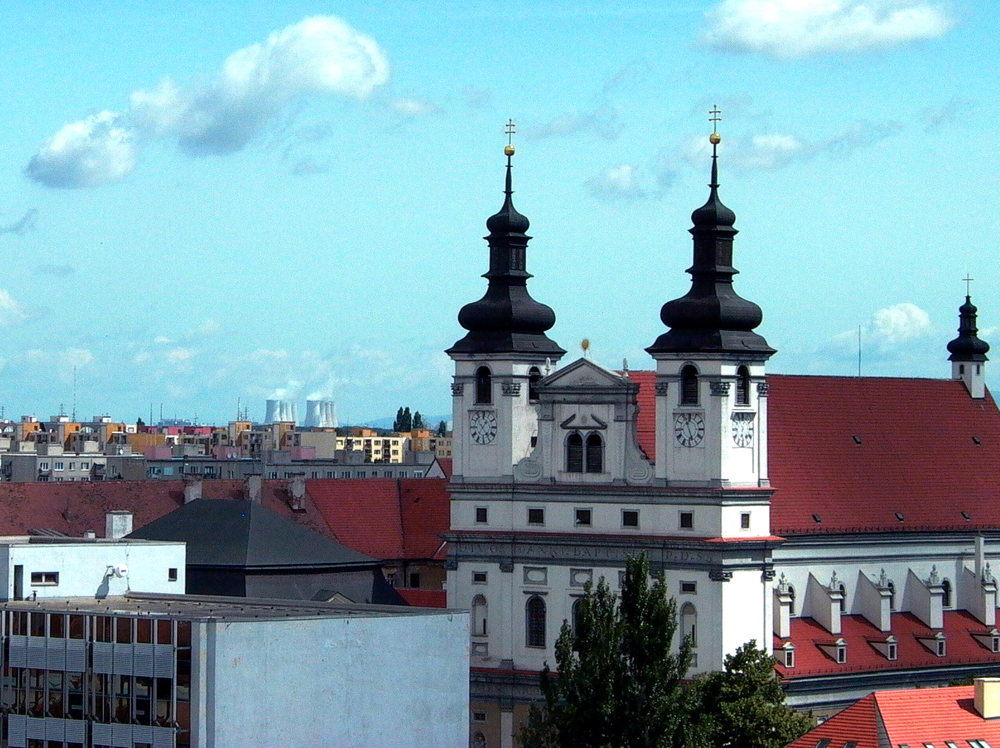

Unlike a random point on the background of the image above, the tip of the tower can be accurately detected in most images of the same scene. It is geometric and photometrically invariant.

### Characteristics of Good Features:

A good local feature is like the piece we start with when solving a puzzle, except on a much smaller scale. It’s a cat’s eye or the corner of the table, not a piece on a white wall.

The extracted image features must be:

* Repeatable and precise so that they can be extracted from different images showing the same object.
* Distinctive to the image, so images with different structure will not have them.

Let’s start with importing the necessary libraries

In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os

Now, we will load the image that we need for this task:

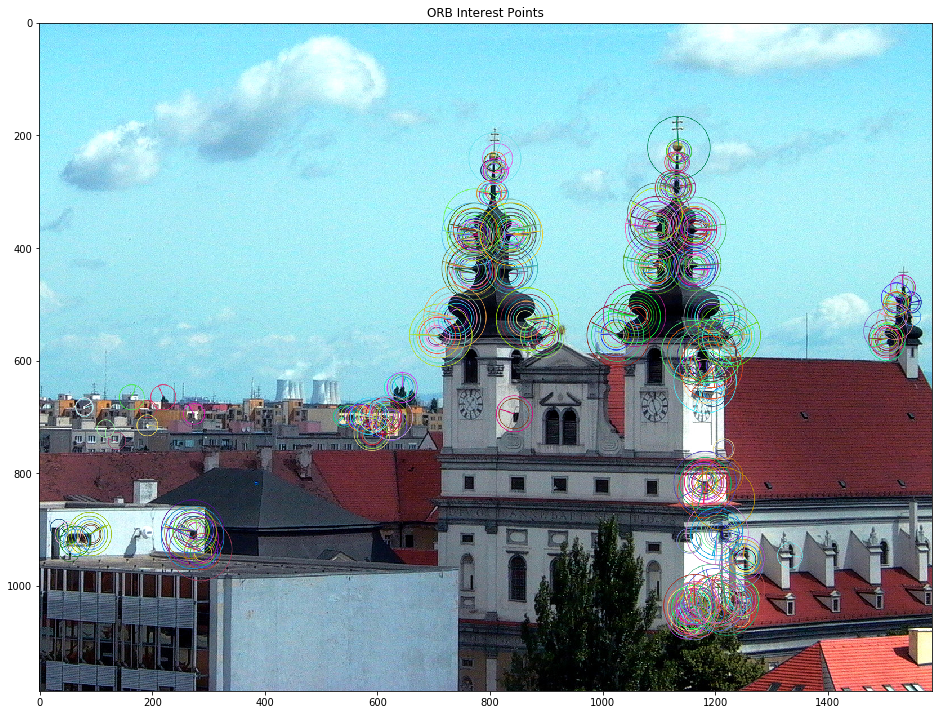

In [2]:
img_building = cv2.imread(os.path.join('buildings/building_1.jpg'))
img_building = cv2.cvtColor(img_building, cv2.COLOR_BGR2RGB)
orb = cv2.ORB_create()  # OpenCV 3 backward incompatibility: Do not create a detector with `cv2.ORB()`.
key_points, description = orb.detectAndCompute(img_building, None)
img_building_keypoints = cv2.drawKeypoints(img_building,key_points,img_building,
                                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw circles.
plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(img_building_keypoints) 
plt.show()

The points of image features found are circled in the image above. As we can see, some of these points are unique to this building, like the points near the top of the two towers. However, others like those at the top of the tree may not be distinctive.

### Feature Matching

Now, let’s see if we can extract the same features from the image that is taken from a different angle:

In [3]:
def image_detect_and_compute(detector, img_name):
    img = cv2.imread(img_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des

In [4]:
def draw_image_matches(detector, img1_name, img2_name, nmatches=10):

    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance.  Best come first.
    
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) # Show top 10 matches
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches)
    plt.show()

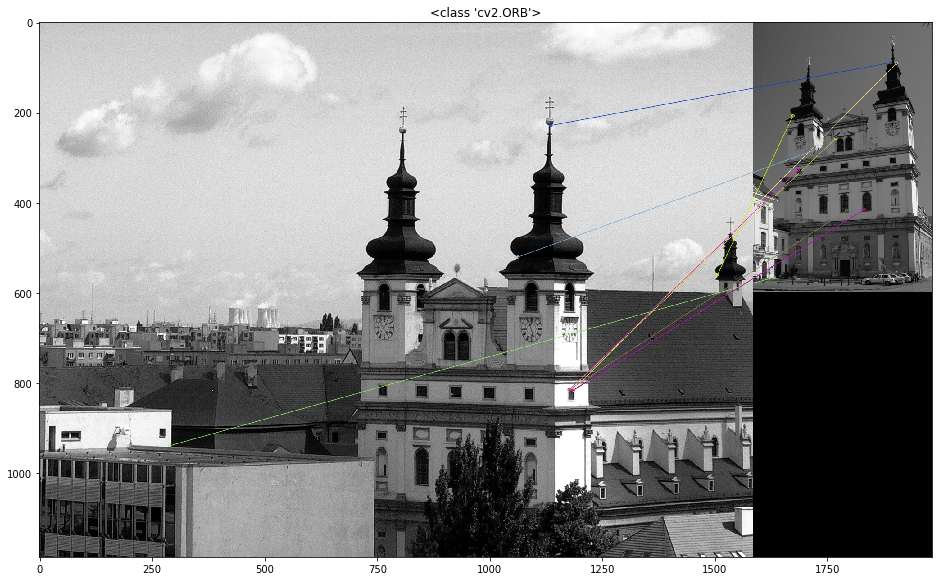

In [5]:
orb = cv2.ORB_create()
draw_image_matches(orb, 'buildings/building_1.jpg', 'buildings/building_2.jpg')

In [6]:
# !pip install opencv-contrib-python --user

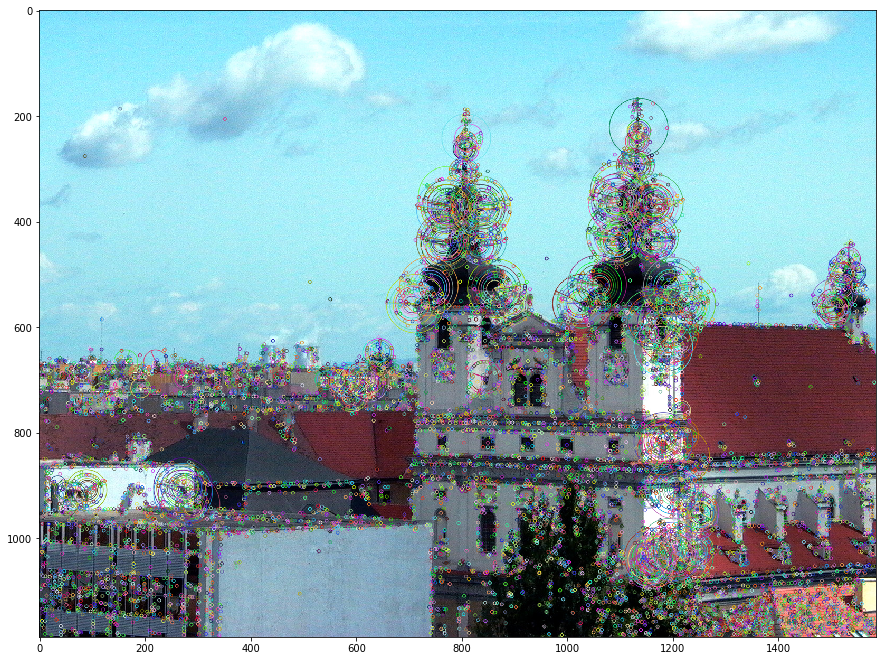

In [7]:
sift = cv2.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(img_building, None)
img_kp = cv2.drawKeypoints(img_building, kp, img_building)

plt.figure(figsize=(15, 15))
plt.imshow(img_kp)
plt.show()

More than half of the first 10 matches were correct. In real applications, instead of using the first **n** matches, a match distance threshold is used to filter out spurious matches.